# Vizualizing National Prison Demographics by County
#### By Khyatee Desai<br>Oct. 13, 2020
## Data Sources:
https://www.prisonpolicy.org/racialgeography/counties.html

In [192]:
import pandas as pd
import requests
from bs4 import BeautifulSoup
from matplotlib import pyplot as plt
import folium
%matplotlib inline

In [58]:
# with open('scraped_data.html', 'w') as writer:
#     writer.write(requests.get("https://www.prisonpolicy.org/racialgeography/counties.html").text)

In [137]:
with open('scraped_data.html', 'r') as page:
    soup = BeautifulSoup(page, 'html.parser')

### Parse through the html using BeautifulSoup, and create a list of lists containing the table data

In [138]:
table=[]
row=[]
for col in soup.find('tr').findAll('th'):
    row.append(col.text)
table.append(row)

for line in soup.findAll('tr')[1:]:
    row=[]
    for col in line.findAll('td'):
        row.append(col.text)
    table.append(row)
print(table[:10])

[['County', 'State', 'Total Population', 'Total White Population', 'Total Black Population', 'Total Latino Population', 'Incarcerated Population', 'Incarcerated White Population', 'Incarcerated Black Population', 'Incarcerated Latino Population', 'Non-incarcerated Population', 'Non-incarcerated White Population', 'Non-Incarcerated Black Population', 'Non-Incarcerated Latino Population', 'Ratio of Overrepresentation of Whites Incarcerated Compared to Whites Non-Incarcerated', 'Ratio of Overrepresentation of Blacks Incarcerated Compared to Blacks Non-Incarcerated', 'Ratio of Overrepresentation of Latinos Incarcerated Compared to Latinos Non-Incarcerated'], ['Autauga County', 'Alabama', '54,571', '42,154', '9,643', '1,310', '181', '71', '80', '31', '54,390', '42,083', '9,563', '1,279', '0.51', '2.51', '7.29'], ['Baldwin County', 'Alabama', '182,265', '152,200', '17,105', '7,992', '1,050', '530', '513', '5', '181,215', '151,670', '16,592', '7,987', '0.6', '5.33', '0.11'], ['Barbour County'

### Create a Pandas DataFrame from the parsed data

In [185]:
df = pd.DataFrame(table)
df.head()

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16
0,County,State,Total Population,Total White Population,Total Black Population,Total Latino Population,Incarcerated Population,Incarcerated White Population,Incarcerated Black Population,Incarcerated Latino Population,Non-incarcerated Population,Non-incarcerated White Population,Non-Incarcerated Black Population,Non-Incarcerated Latino Population,Ratio of Overrepresentation of Whites Incarcer...,Ratio of Overrepresentation of Blacks Incarcer...,Ratio of Overrepresentation of Latinos Incarce...
1,Autauga County,Alabama,"54,571","42,154","9,643","1,310",181,71,80,31,"54,390","42,083","9,563","1,279",0.51,2.51,7.29
2,Baldwin County,Alabama,"182,265","152,200","17,105","7,992","1,050",530,513,5,"181,215","151,670","16,592","7,987",0.6,5.33,0.11
3,Barbour County,Alabama,"27,457","12,837","12,875","1,387","3,044","1,200","1,794",23,"24,413","11,637","11,081","1,364",0.83,1.3,0.14
4,Bibb County,Alabama,"22,915","17,191","5,047",406,"2,007",595,"1,357",54,"20,908","16,596","3,690",352,0.37,3.83,1.6


### Data Cleaning
Renaming columns, imputing Null values, removing commas, changing data types, yada yada

In [186]:
# Set first column as headers, drop unnecessary columns
df.columns = df.iloc[0]
df = df.iloc[1:]
df.drop(index= 2782, inplace=True)
df.rename(columns={'Ratio of Overrepresentation of Whites Incarcerated Compared to Whites Non-Incarcerated':'White Overrepresentation', 'Ratio of Overrepresentation of Blacks Incarcerated Compared to Blacks Non-Incarcerated': 'Black Overrepresentation', 'Ratio of Overrepresentation of Latinos Incarcerated Compared to Latinos Non-Incarcerated':'Latino Overrepresentation'}, inplace=True)

In [257]:
# Remove the word 'county' in the county column
df['County'] = df['County'].str.replace(' County','')

In [187]:
# Replace text 'NA' values with zeros
df['Black Overrepresentation'] = df['Black Overrepresentation'].str.replace('NA', '0')
df['Latino Overrepresentation'] = df['Latino Overrepresentation'].str.replace('NA', '0')

In [188]:
# Remove commas and change datatypes to floats
for col in df.columns[2:]:
    try:
        df[col] = df[col].str.replace(',', '').astype(float)
    except:
        pass
df.dtypes

0
County                                 object
State                                  object
Total Population                      float64
Total White Population                float64
Total Black Population                float64
Total Latino Population               float64
Incarcerated Population               float64
Incarcerated White Population         float64
Incarcerated Black Population         float64
Incarcerated Latino Population        float64
Non-incarcerated Population           float64
Non-incarcerated White Population     float64
Non-Incarcerated Black Population     float64
Non-Incarcerated Latino Population    float64
White Overrepresentation              float64
Black Overrepresentation              float64
Latino Overrepresentation             float64
dtype: object

In [258]:
df.sample(5)

,County,State,Total Population,Total White Population,Total Black Population,Total Latino Population,Incarcerated Population,Incarcerated White Population,Incarcerated Black Population,Incarcerated Latino Population,Non-incarcerated Population,Non-incarcerated White Population,Non-Incarcerated Black Population,Non-Incarcerated Latino Population,White Overrepresentation,Black Overrepresentation,Latino Overrepresentation
3000,Calhoun,West Virginia,7627.0,7465.0,16.0,57.0,0.0,0.0,0.0,0.0,7627.0,7465.0,16.0,57.0,0.00,0.00,0.00
2878,Mecklenburg,Virginia,32727.0,19215.0,12050.0,806.0,1310.0,379.0,894.0,39.0,31417.0,18836.0,11156.0,767.0,0.48,1.92,1.22
865,Pocahontas,Iowa,7310.0,7043.0,26.0,166.0,5.0,5.0,0.0,0.0,7305.0,7038.0,26.0,166.0,1.04,0.00,0.00
2724,Rusk,Texas,53330.0,35237.0,9435.0,7609.0,4701.0,2092.0,1701.0,894.0,48629.0,33145.0,7734.0,6715.0,0.65,2.28,1.38
1517,Douglas,Missouri,13684.0,13218.0,30.0,110.0,18.0,18.0,0.0,0.0,13666.0,13200.0,30.0,110.0,1.04,0.00,0.00


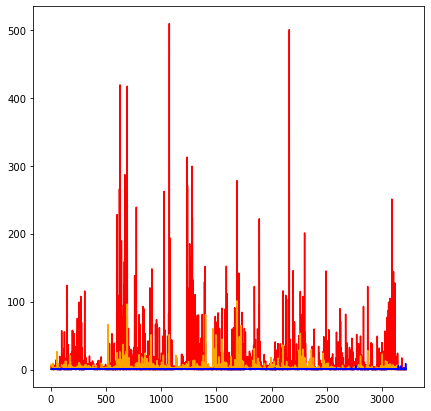

In [190]:
fig= plt.figure(figsize=(7,7))

plt.plot(df['Black Overrepresentation'], color='red');
plt.plot(df['Latino Overrepresentation'], color='orange');
plt.plot(df['White Overrepresentation'], color='blue');


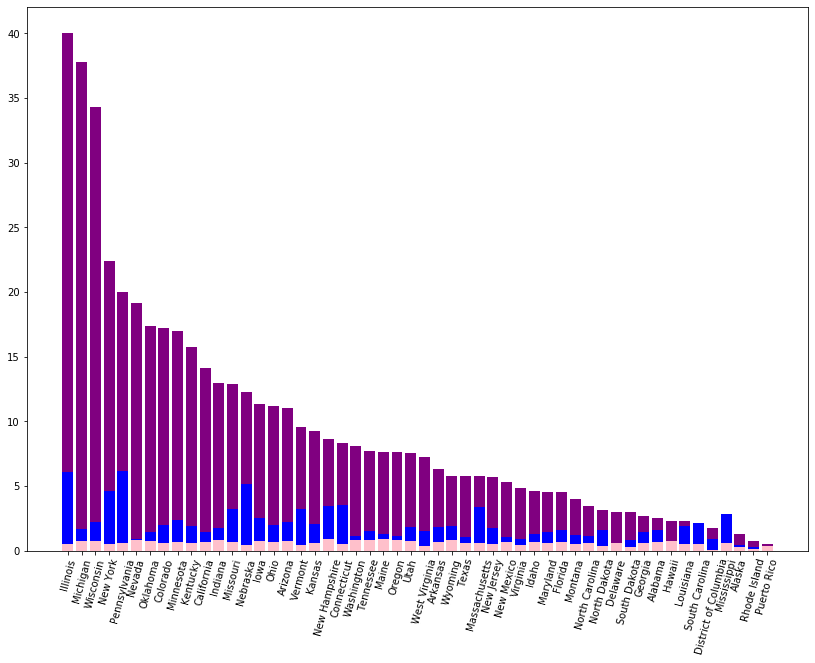

In [191]:
grouped = df.groupby('State')[['White Overrepresentation', 'Black Overrepresentation', 'Latino Overrepresentation']].mean().sort_values('Black Overrepresentation',ascending=False)

fig= plt.figure(figsize=(14,10));
plt.bar(x=grouped.index, height=grouped['Black Overrepresentation'], color='purple');
plt.bar(x=grouped.index, height=grouped['Latino Overrepresentation'], color='blue');
plt.bar(x=grouped.index, height=grouped['White Overrepresentation'], color='pink');
plt.xticks(rotation=75);

In [198]:
df.sort_values('Black Overrepresentation', ascending=False).head(5)

,County,State,Total Population,Total White Population,Total Black Population,Total Latino Population,Incarcerated Population,Incarcerated White Population,Incarcerated Black Population,Incarcerated Latino Population,Non-incarcerated Population,Non-incarcerated White Population,Non-Incarcerated Black Population,Non-Incarcerated Latino Population,White Overrepresentation,Black Overrepresentation,Latino Overrepresentation
1073,Martin County,Kentucky,12929.0,11533.0,896.0,388.0,1579.0,327.0,884.0,340.0,11350.0,11206.0,12.0,48.0,0.21,508.95,51.27
2161,Harper County,Oklahoma,3685.0,2957.0,3.0,645.0,4.0,2.0,1.0,0.0,3681.0,2955.0,2.0,645.0,0.62,500.00,0.00
626,Greene County,Illinois,13886.0,13517.0,119.0,115.0,203.0,86.0,102.0,14.0,13683.0,13431.0,17.0,101.0,0.43,418.72,9.32
691,Wayne County,Illinois,16760.0,16340.0,42.0,176.0,2.0,0.0,2.0,2.0,16758.0,16340.0,40.0,174.0,0.00,416.67,96.15
1233,Alger County,Michigan,9601.0,8213.0,612.0,114.0,863.0,251.0,593.0,11.0,8738.0,7962.0,19.0,103.0,0.32,312.34,1.08


### Read County lat/long Coordinates csv

In [254]:
counties = pd.read_csv('uscities.csv').loc[:,['city', 'state_name', 'county_name', 'lat', 'lng']]
counties = counties.groupby(['county_name', 'state_name'])['lat', 'lng'].mean().reset_index()
counties[counties.state_name == 'Alabama']

/Users/Khyatee/anaconda3/envs/learn-env/lib/python3.6/site-packages/ipykernel_launcher.py:2: FutureWarning: Indexing with multiple keys (implicitly converted to a tuple of keys) will be deprecated, use a list instead.
  


,county_name,state_name,lat,lng
117,Autauga,Alabama,32.562500,-86.547800
127,Baldwin,Alabama,30.554945,-87.723960
138,Barbour,Alabama,31.787050,-85.429850
211,Bibb,Alabama,33.059925,-87.145725
231,Blount,Alabama,33.957085,-86.576808
...,...,...,...,...
2897,Tuscaloosa,Alabama,33.224356,-87.420033
2977,Walker,Alabama,33.824236,-87.321464
3014,Washington,Alabama,31.345264,-88.168279
3115,Wilcox,Alabama,31.999800,-87.314371


In [271]:
# merge coordinates dataframe with main data df
merged =df.merge(counties, how='inner', left_on=['County','State'], right_on=['county_name','state_name'])
merged.drop(columns=['county_name', 'state_name'], inplace=True)

In [272]:
merged

,County,State,Total Population,Total White Population,Total Black Population,Total Latino Population,Incarcerated Population,Incarcerated White Population,Incarcerated Black Population,Incarcerated Latino Population,Non-incarcerated Population,Non-incarcerated White Population,Non-Incarcerated Black Population,Non-Incarcerated Latino Population,White Overrepresentation,Black Overrepresentation,Latino Overrepresentation,lat,lng
0,Autauga,Alabama,54571.0,42154.0,9643.0,1310.0,181.0,71.0,80.0,31.0,54390.0,42083.0,9563.0,1279.0,0.51,2.51,7.29,32.562500,-86.547800
1,Baldwin,Alabama,182265.0,152200.0,17105.0,7992.0,1050.0,530.0,513.0,5.0,181215.0,151670.0,16592.0,7987.0,0.60,5.33,0.11,30.554945,-87.723960
2,Barbour,Alabama,27457.0,12837.0,12875.0,1387.0,3044.0,1200.0,1794.0,23.0,24413.0,11637.0,11081.0,1364.0,0.83,1.30,0.14,31.787050,-85.429850
3,Bibb,Alabama,22915.0,17191.0,5047.0,406.0,2007.0,595.0,1357.0,54.0,20908.0,16596.0,3690.0,352.0,0.37,3.83,1.60,33.059925,-87.145725
4,Blount,Alabama,57322.0,50952.0,761.0,4626.0,129.0,118.0,6.0,5.0,57193.0,50834.0,755.0,4621.0,1.03,3.52,0.48,33.957085,-86.576808
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2995,Sweetwater,Wyoming,43806.0,35432.0,438.0,6689.0,132.0,87.0,6.0,27.0,43674.0,35345.0,432.0,6662.0,0.81,4.59,1.34,41.632526,-109.182832
2996,Teton,Wyoming,21294.0,17505.0,49.0,3191.0,0.0,0.0,0.0,0.0,21294.0,17505.0,49.0,3191.0,0.00,0.00,0.00,43.515844,-110.815633
2997,Uinta,Wyoming,21118.0,18696.0,55.0,1855.0,43.0,39.0,0.0,2.0,21075.0,18657.0,55.0,1853.0,1.02,0.00,0.53,41.280278,-110.484378
2998,Washakie,Wyoming,8533.0,7158.0,22.0,1162.0,10.0,8.0,0.0,2.0,8523.0,7150.0,22.0,1160.0,0.95,0.00,1.47,44.018750,-107.701300


## Make Folium Map

In [292]:
lat = 40.7128
long = -74.0060

#Create a map of the area
base_map = folium.Map([lat, long], zoom_start=5, tiles='Stamen Toner')


In [304]:
merged['color']=merged['Black Overrepresentation'].apply(lambda count:"Black" if count>=400 else
                                         "brown" if count>=200 and count<400 else
                                         "red" if count>=100 and count<200 else
                                         "Orange" if count>=50 and count<100 else
                                         "green" if count>=15 and count<50 else
                                         "darkblue" if count>=5 and count<15 else
                                         "lightblue" if count>=1 and count<5 else
                                         "grey")
# location['size']=location['count'].apply(lambda count:12 if count>=400 else
#                                          10 if count>=300 and count<400 else
#                                          8 if count>=200 and count<300 else
#                                          6 if count>=150 and count<200 else
#                                          4 if count>=100 and count<150 else
#                                          2 if count>=75 and count<100 else
#                                          1 if count>=50 and count<75 else
#                                          0.1)

In [305]:
for lat,lng,county,color,ratio in zip(merged['lat'],merged['lng'],merged['County'], merged['color'], merged['Black Overrepresentation']):
     folium.CircleMarker([lat, lng],
                            popup=county,
                            tooltip= ('Black Overrepresentation:',ratio),
                            radius=5,
                            color='r',
                            fill=True,
                            fill_opacity=0.7,
                            fill_color=color,
                           ).add_to(base_map)

In [306]:
base_map